In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from mplsoccer.pitch import Pitch
from mplsoccer.pitch import VerticalPitch
import ipywidgets as widgets
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from highlight_text import  ax_text, fig_text

#Read in the data
df = pd.read_csv('Footballdata/Season/EPL.csv', encoding='latin-1', low_memory = False)

#Adjust for pitch size
df['x'] = df['x']*1.2
df['y'] = df['y']*.8
df['endX'] = df['endX']*1.2
df['endY'] = df['endY']*.8

#List it in a combo box
options = df["name"].unique()
options = options.tolist()

options = [x for x in options if str(x) != 'nan']
playerlist = widgets.Combobox(
    placeholder='Enter a name',
    options=options,
    description='Player:',
    ensure_option=True,
    disabled=False
)

playerlist

Combobox(value='', description='Player:', ensure_option=True, options=('Eberechi Eze', 'Joachim Andersen', 'Ma…

In [3]:
#Filter for data (df1 is inclusive of all data of a particular player)
player = playerlist.value
df1 = df.loc[(df['name']== player)]

#df1 = df.loc[(df['playername']== 'Lisandro Martínez') | (df['playername']== 'Raphaël Varane')]

In [4]:
#List of defensive actions
list1 = ["BallRecovery", "Clearance","Interception","Tackle","Foul",
         "BlockedPass","Challenge","Aerial","Save"]

#Filter for defensive actions only
df1 = df1[df1['type_displayName'].isin(list1)]

#Remove headers from corners
df1 = df1.loc[~((df1['x'] > 103) & (df1['y'].between(17,64)) & (df1['type_displayName'] == "Aerial"))]

#Remove Fouls that are won, only keep the fouls conceded
df1 = df1.loc[~((df1['outcomeType_displayName'] == "Successful") & (df1['type_displayName'] == "Foul"))]
#Reminder: Add failed aerial duels
#df1

#df1.loc[df1['type/displayName']== "Tackle"]

In [5]:
#Filter for Unsuccessful Actions 
df2 = df1[df1['outcomeType_displayName'] == 'Unsuccessful']

#Filter for Successful Actions only
df3 = df1.loc[df1['outcomeType_displayName']== "Successful"]
#pd.set_option('display.max_rows', df3.shape[0]+1)

#df3.loc[df3['type/displayName']== "Tackle"]

In [6]:
#Categorize all of the defensive actions using 'successful' dataframe (Except for Foul)
Aerialdf = df3.loc[df3['type_displayName']== "Aerial"]
BallRecoverydf = df3.loc[df3['type_displayName']== "BallRecovery"]
#BlockedPassdf = df3.loc[df3['type_displayName']== "BlockedPass"]
Clearancedf = df3.loc[df3['type_displayName']== "Clearance"]
Interceptiondf = df3.loc[(df3['type_displayName']== "Interception") | (df3['type_displayName']== "BlockedPass")]
Tackledf = df1.loc[df1['type_displayName']== "Tackle"]
Savedf = df3.loc[df3['type_displayName']== "Save"]

#Challenges (It is normally unsuccessful)
Challengedf = df1[df1['type_displayName'] == 'Challenge']

#Foul committed
Fouldf = df2.loc[df2['type_displayName']== "Foul"]

#Failed Aerials
FAerials = df2.loc[df2['type_displayName']== "Aerial"]

# Defensive Half of the Pitch

In [6]:
ddf3 = df3

#Adjust to pitch (for inside own box)
ddf3['x'] = 120 - ddf3['x']
ddf3['y'] = 80 - ddf3['y']

#Categorize all of the defensive actions using 'successful' dataframe (Except for Foul)
Aerialdf = ddf3.loc[(ddf3['type_displayName'] == "Aerial")]
Aerialcount = len(Aerialdf.index)

Clearancedf = ddf3.loc[ddf3['type_displayName'] == "Clearance"]
Clearancecount = len(Clearancedf.index)

Interceptiondf = ddf3.loc[(ddf3['type_displayName'] == "Interception") | (ddf3['type_displayName'] == "BlockedPass")]
Interceptioncount = len(Interceptiondf.index)

Tackledf = ddf3.loc[ddf3['type_displayName'] == "Tackle"]
Tacklecount = len(Tackledf.index)

Savedf = ddf3.loc[ddf3['type_displayName'] == "Save"]
Savecount = len(Savedf.index)

Savedf = ddf3.loc[ddf3['type_displayName'] == "Save"]
Savecount = len(Savedf.index)


#Set up pitch
mpl.rcParams['figure.dpi'] = 500
pitch = VerticalPitch(pitch_type='statsbomb', 
                  pitch_color='#000000', line_color='white',half = False,
                  line_zorder=1, linewidth=8, spot_scale=0.003)

fig,ax = pitch.draw(figsize=(30, 23), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#000000')

#Inverse the y-axis
plt.gca().invert_yaxis()

#Plot points

if Clearancedf.empty == False:
    pitch.scatter(Clearancedf.x,Clearancedf.y, marker='P', s=4000, alpha=0.7,
                  c='#ff633a', edgecolor='w', linewidth=5, ax=ax)

if Tackledf.empty == False:
    pitch.scatter(Tackledf.x,Tackledf.y, marker='o', s=5000, alpha=0.9,
                  c='#1d9bf0', edgecolor='w', linewidth=5, ax=ax)

if Interceptiondf.empty == False:
    pitch.scatter(Interceptiondf.x,Interceptiondf.y, marker='H', s=5000, alpha=0.8,
                  c='#973cff', edgecolor='w',linewidth=5, ax=ax)

"""if Aerialdf.empty == False:
    pitch.scatter(Aerialdf.x,Aerialdf.y, marker=(5,1), s=5000, alpha=0.8,
                  c='#008140', edgecolor='w', linewidth=5, ax=ax)
"""
if Savedf.empty == False:
    pitch.scatter(Savedf.x, Savedf.y, marker='h', s=3000, c='#008140', alpha=0.75,
                  edgecolor='w', linewidth=5, ax=ax)

#Title & Annotations
fig.suptitle("\n\n"+player+"'s Defensive Actions\n\n", fontsize=70, color='yellow',
            fontfamily = "Courier New", fontweight = "bold",y=0.985)

highlight_textprops =\
    [{"color": "#ff633a","fontweight": 'bold'},
     {"color": "#1d9bf0","fontweight": 'bold'},
     {"color": "#973cff","fontweight": 'bold'},
     {"color": "#008140","fontweight": 'bold'},
    
    ]

Title = fig_text(s = "<Clearance> | <Tackle> | <Interception> | <Blocks>" ,
        x = 0.5, y = 0.84, highlight_textprops = highlight_textprops ,color='white',
        fontfamily = "Courier New",fontweight='bold', ha='center',fontsize=50)

ax.text(-10, 70, 'space', va='center', ha='left', fontsize=25, color='black',
        fontweight = "bold",fontfamily = "Courier New")

ax.text(86, 70, 'space', va='center', ha='left', fontsize=25, color='black',
        fontweight = "bold",fontfamily = "Courier New")

plt.show()

C:\Users\user\AppData\Local\Temp/ipykernel_1168/2891811941.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ddf3['x'] = 120 - ddf3['x']
C:\Users\user\AppData\Local\Temp/ipykernel_1168/2891811941.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ddf3['y'] = 80 - ddf3['y']


# Vertical Pitch

In [7]:
"""Martinezdf = Aerialdf.loc[(Aerialdf['playername'] == "Lisandro Martínez")]
Martinezcount = len(Martinezdf.index)

Varanedf = Aerialdf.loc[(Aerialdf['playername'] == "Raphaël Varane")]
Varanecount = len(Varanedf.index)
"""
#Set up pitch
pitch = VerticalPitch(pitch_type='statsbomb', 
                  pitch_color='#000000', line_color='white',half = False,
                  line_zorder=1, linewidth=5, spot_scale=0.006)

fig,ax = pitch.draw(figsize=(30, 20), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#000000')

#Inverse the y-axis
plt.gca().invert_xaxis()

#Plot points
"""
if Martinezdf.empty == False:
    pitch.scatter(Martinezdf.x,Martinezdf.y, marker='o', s=3000, c='#1d9bf0', alpha=0.7,
                  edgecolor='w', linewidth=5, label=' Tackle ', ax=ax)

if Varanedf.empty == False:
    pitch.scatter(Varanedf.x,Varanedf.y, marker='o', s=3500, c='#ff633a', alpha=0.7,
                  edgecolor='w', linewidth=5, label=' Tackle ', ax=ax)


"""
if BallRecoverydf.empty == False:
    pitch.scatter(BallRecoverydf.x,BallRecoverydf.y, marker=(5,1), s=3500, c='#008140', alpha=0.8,
                  edgecolor='w', linewidth=4, label=' Recovery ', ax=ax)

"""if Tackledf.empty == False:
    pitch.scatter(Tackledf.x,Tackledf.y, marker='o', s=3500, c='#1d9bf0', alpha=0.9,
                  edgecolor='w', linewidth=4, label=' Tackle ', ax=ax)

if Interceptiondf.empty == False:
    pitch.scatter(Interceptiondf.x,Interceptiondf.y, marker='H', s=3500, c='#ff633a', alpha=0.9,
                  edgecolor='w',linewidth=4,  label=' Interception ', ax=ax)

if Clearancedf.empty == False:
    pitch.scatter(Clearancedf.x, Clearancedf.y, marker='P', s=3000, c='#ff633a', alpha=0.85,
                  edgecolor='w', linewidth=4, label=' Clearance ', ax=ax)
                
if Aerialdf.empty == False:
    pitch.scatter(Aerialdf.x,Aerialdf.y, marker='^', s=3000, c='#7b00f7', 
                  edgecolor='w', linewidth=3.5, label=' Aerial ',ax=ax)

if Savedf.empty == False:
    pitch.scatter(Savedf.x,Savedf.y, marker='h', s=3000, c='#1d9bf0', 
                  edgecolor='w', linewidth=3.5, label=' Blocked Shot ',ax=ax)

if Challengedf.empty == False:
    pitch.scatter(Challengedf.x,Challengedf.y, marker=(5,0), s=3000, c='#1d9bf0', 
                  edgecolor='white', linewidth=3.5, label=' Failed\n Challenge ',ax=ax)

if Fouldf.empty == False:   
    pitch.scatter(Fouldf.x,Fouldf.y, marker='X', s=3000, c='crimson', 
                  edgecolor='white', linewidth=3.5, label=' Foul ',ax=ax)
"""
# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(-0.155, 1.02),facecolor='#000000', edgecolor='None',
                   labelspacing=10, ncol=4)

for text in legend.get_texts():
    text.set_fontsize(35)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

#Title
plt.text(98,135,"Aerial Duels Won | Premier League",color='yellow',
          size=45, fontfamily = "Courier New", fontweight = "bold")

highlight_textprops =\
    [
     {"color": "#1d9bf0","fontweight": 'bold'},
     {"color": "#ff633a","fontweight": 'bold'}
     ]

Title = fig_text(s = "<Lisandro Martínez> | <Raphaël Varane>" ,
        x = 0.5, y = 0.87, highlight_textprops = highlight_textprops ,color='white',
        fontfamily = "Courier New",fontweight='bold', ha='center',fontsize=35)

ax.text(40,145, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')
ax.text(-10, -10, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')
ax.text(100, -10, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')

plt.show()

NameError: name 'oppo' is not defined

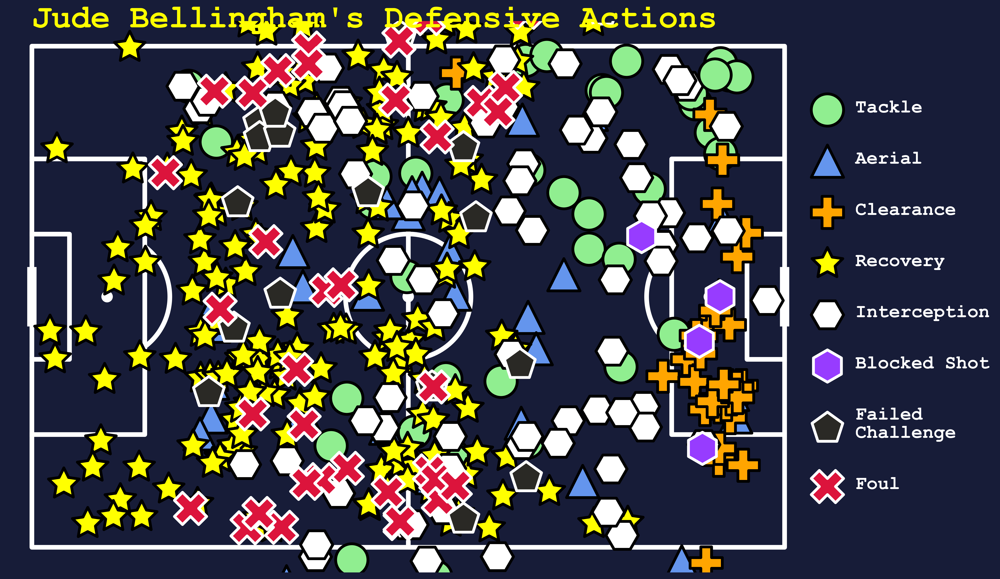

In [8]:
#Set up pitch
pitch = Pitch( pitch_type='statsbomb',linewidth=5, spot_scale=0.007,
             pitch_color='#171c38',line_color='white')
fig,ax = pitch.draw(figsize=(15, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#171c38')

#Inverse the y-axis
plt.gca().invert_yaxis()

#Plot points
if Tackledf.empty == False:
    plt.scatter(Tackledf.x,Tackledf.y, marker='o', s=1200, c='lightgreen', edgecolor='black', linewidth=3, label=' Tackle')

if Aerialdf.empty == False:
    plt.scatter(Aerialdf.x,Aerialdf.y, marker='^', s=1200, c='cornflowerblue', edgecolor='black', linewidth=3, label=' Aerial')

if Clearancedf.empty == False:
    plt.scatter(Clearancedf.x,Clearancedf.y, marker='P', s=1200, c='orange', edgecolor='black', linewidth=3, label=' Clearance')

if BallRecoverydf.empty == False:
    plt.scatter(BallRecoverydf.x,BallRecoverydf.y, marker=(5,1), s=1200, c='yellow', edgecolor='black', linewidth=3, label=' Recovery')

if Interceptiondf.empty == False:
    plt.scatter(Interceptiondf.x,Interceptiondf.y, marker='H', s=1200, c='white', edgecolor='black',linewidth=3,  label=' Interception')

if Savedf.empty == False:
    plt.scatter(Savedf.x,Savedf.y, marker='h', s=1200, c='#973cff', edgecolor='w', linewidth=3, label=' Blocked Shot')

if Challengedf.empty == False:
    plt.scatter(Challengedf.x,Challengedf.y, marker=(5,0), s=1200, c='#2a2925', edgecolor='white', linewidth=3, label=' Failed\n Challenge')

if Fouldf.empty == False:   
    plt.scatter(Fouldf.x,Fouldf.y, marker='X', s=1200, c='crimson', edgecolor='white', linewidth=3, label=' Foul')

#Title
plt.text(0,83,player + "'s Defensive Actions",color='yellow',
          size=35, fontfamily = "Courier New", fontweight = "bold")

# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),facecolor='#171c38', edgecolor='None',
                   labelspacing=3.8)

for text in legend.get_texts():
    text.set_fontsize(20)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

#ax.text(-0.5, -3, 'Made by @chunhang7', va='center', ha='left', fontsize=25, color='white',fontweight='bold',fontfamily='Courier New')
ax.text(80, -3, 'vs '+oppo, va='center', ha='left', fontsize=25, color='white',fontweight='bold',fontfamily='Courier New')
plt.show()

# Defensive Actions Heatmaps

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


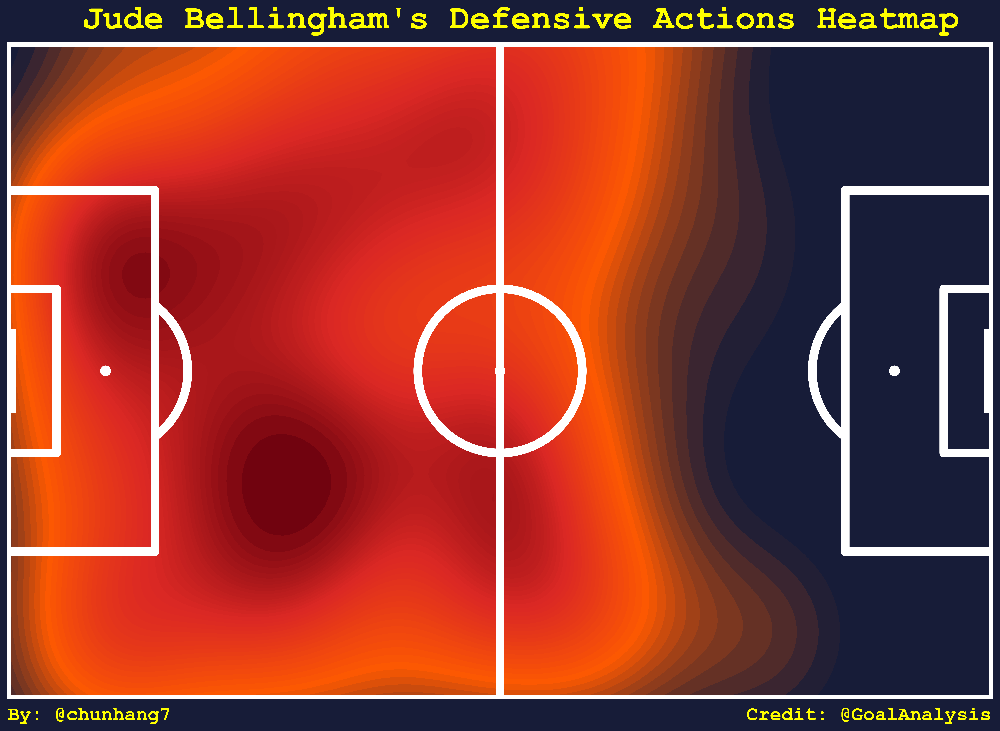

In [14]:
#Remove warning
pd.options.mode.chained_assignment = None 

#Set Colors for heatmaps
customcmap = LinearSegmentedColormap.from_list('custom cmap', ['#171c38','#fd5901','#db2824','#67000d'])

#Make the pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='#171c38', line_color='white',linewidth=9, spot_scale=0.005,line_zorder=1)
fig, ax = pitch.draw(figsize=(15, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#171c38')

#Inverse y-axis
plt.gca().invert_yaxis()

#Set plot boundaries
plt.xlim(0,120)
plt.ylim(0,80)

#Heatmaps of progressive passes origin
kde = sns.kdeplot(df3['x'], df3['y'], shade = True, 
                  shade_lowest= False, n_levels=50, linewidths=3, alpha=1, zorder=0.5, cmap=customcmap)

#Title & Annotations
fig.suptitle(player+"'s Defensive Actions Heatmap", fontsize=35, color='yellow',
            fontfamily = "Courier New", fontweight = "bold",y=0.95)

#Credits
ax.text(0.1, -2, 'By: @chunhang7', va='center', ha='left', fontsize=20, color='yellow',
        fontweight = "bold",fontfamily = "Courier New")

ax.text(90, -2, 'Credit: @GoalAnalysis', va='center', ha='left', fontsize=20, color='yellow',
        fontweight = "bold",fontfamily = "Courier New");

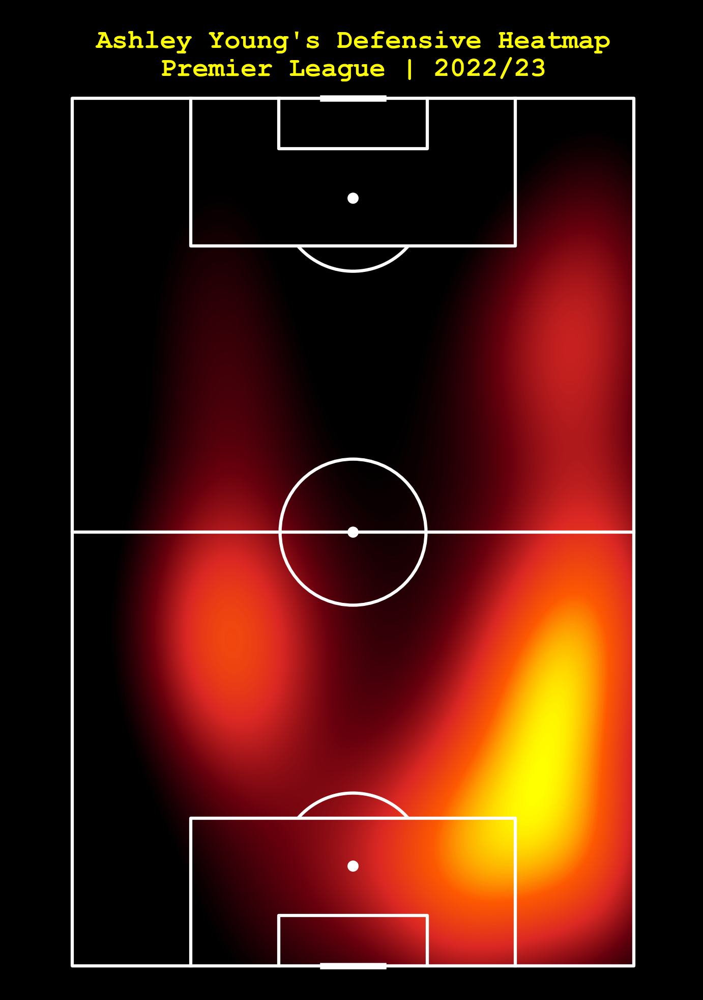

In [9]:
#ignore warnings
#warnings.simplefilter(action="ignore", category=FutureWarning)

#Set Color
customcmap = LinearSegmentedColormap.from_list('custom cmap', ['#000000','#67000d','#db2824','#fd5901','yellow'])

pitch = VerticalPitch(pitch_type='opta', pitch_color='#000000', line_color='white',half = False,
                  line_zorder=1, linewidth=4.5, spot_scale=0.006)

fig,ax = pitch.draw(figsize=(30, 20), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#000000')

kde = pitch.kdeplot(df1.x, df1.y, ax=ax, cmap=customcmap, fill=True, 
                    shade_lowest=False, n_levels=400, linewidths=3, alpha=1, zorder=0.99)

#Title & Annotations
fig.suptitle("\n"+player+"'s Defensive Heatmap\nPremier League | 2022/23", fontsize=38, color='yellow',
            fontfamily = "Courier New", fontweight = "bold", y=0.98)

ax.text(112, -2.5, 'space', va='center', ha='left', fontsize=25, color='black',
        fontweight = "bold",fontfamily = "Courier New")

ax.text(-2, -2.5, 'space', va='center', ha='left', fontsize=25, color='black',
        fontweight = "bold",fontfamily = "Courier New")

plt.show()

# Breakdown of Defensive Actions

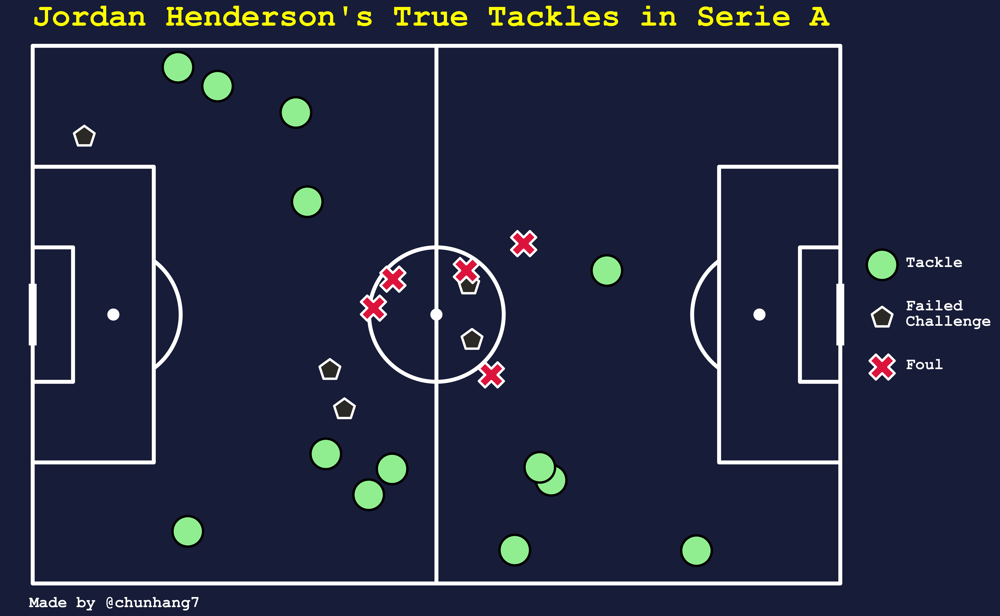

In [10]:
#Set up pitch
pitch = Pitch( pitch_type='statsbomb',linewidth=5, spot_scale=0.007,
             pitch_color='#171c38',line_color='white')
fig,ax = pitch.draw(figsize=(18, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#171c38')

#Inverse the y-axis
plt.gca().invert_yaxis()

#Plot points
if Tackledf.empty == False:
    plt.scatter(Tackledf.x,Tackledf.y, marker='o', s=1500, c='lightgreen',
                edgecolor='black', linewidth=3, label=' Tackle', zorder= 3)
    
if Challengedf.empty == False:
    plt.scatter(Challengedf.x,Challengedf.y, marker=(5,0), s=750, c='#2a2925', 
                edgecolor='white', linewidth=3, label=' Failed\n Challenge',zorder= 3)

if Fouldf.empty == False:   
    plt.scatter(Fouldf.x,Fouldf.y, marker='X', s=1000, c='crimson',
                edgecolor='white', linewidth=3, label=' Foul', zorder= 4)

"""if Interceptiondf.empty == False:
    plt.scatter(Interceptiondf.x,Interceptiondf.y, marker='H', s=1500, c='yellow', 
                edgecolor='black',linewidth=3, label=' Interception',zorder= 2)
"""
#Title
plt.text(0,83,player + "'s True Tackles in Serie A",color='yellow',
          size=40, fontfamily = "Courier New", fontweight = "bold")

# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),facecolor='#171c38', edgecolor='None',
                   labelspacing=3.8)

for text in legend.get_texts():
    text.set_fontsize(20)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

ax.text(-0.5, -3, 'Made by @chunhang7', va='center', ha='left', fontsize=20, color='white',fontweight='bold',fontfamily='Courier New')

plt.show()

NameError: name 'BlockedPassdf' is not defined

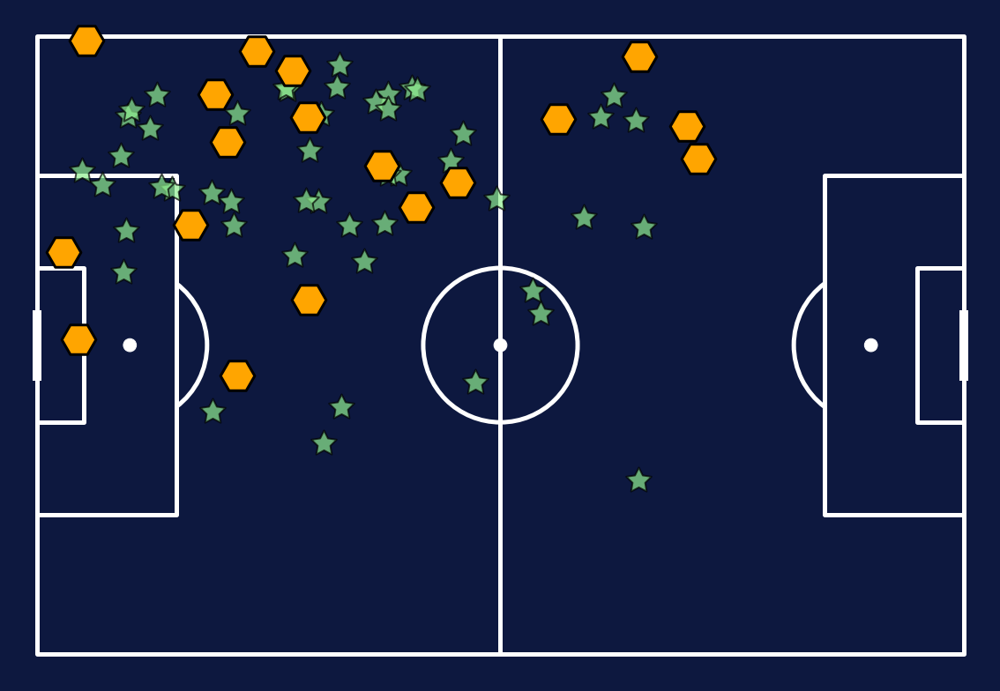

In [17]:
#Set up pitch
pitch = Pitch( pitch_type='statsbomb',linewidth=5, spot_scale=0.007,
             pitch_color='#0d183f',line_color='white')
fig,ax = pitch.draw(figsize=(18, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#0d183f')

#Inverse the y-axis
plt.gca().invert_yaxis()

#Plot points
if BallRecoverydf.empty == False:
    plt.scatter(BallRecoverydf.x,BallRecoverydf.y, marker=(5,1), s=900, c='lightgreen', edgecolor='black',alpha=0.7, linewidth=2, label=' Recovery')

if Interceptiondf.empty == False:
    plt.scatter(Interceptiondf.x,Interceptiondf.y, marker='H', s=1500, c='orange', edgecolor='black',linewidth=3,  label=' Interception')

if BlockedPassdf.empty == False:
    plt.scatter(BlockedPassdf.x,BlockedPassdf.y, marker='s', s=1500, c='yellow', edgecolor='black', linewidth=3, label=' Blocked Pass')

if Savedf.empty == False:
    plt.scatter(Savedf.x,Savedf.y, marker='h', s=1500, c='red', edgecolor='black', linewidth=3, label=' Blocked Shot')

#Title
plt.text(0,83,player + "'s True Interceptions in Serie A" ,color='yellow',
          size=40, fontfamily = "Courier New", fontweight = "bold")

# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),facecolor='#0d183f', edgecolor='None',
                   labelspacing=3.8)

for text in legend.get_texts():
    text.set_fontsize(20)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

ax.text(-0.4, -2.5, 'Made by @chunhang7', va='center', ha='left', fontsize=20, color='white',fontweight='bold',fontfamily='Courier New')

plt.show()

In [ ]:
#Set up pitch
pitch = Pitch( pitch_type='statsbomb',linewidth=5, spot_scale=0.007,
             pitch_color='#0d183f',line_color='white')
fig,ax = pitch.draw(figsize=(18, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#0d183f')

#Inverse the y-axis
plt.gca().invert_yaxis()

#Plot points
if FAerials.empty == False:
    plt.scatter(FAerials.x,FAerials.y, marker='^', s=1500, c='crimson',alpha=0.7, edgecolor='w', linewidth=3, label=' Failed\n Aerial')

if Aerialdf.empty == False:
    plt.scatter(Aerialdf.x,Aerialdf.y, marker='^', s=1500, c='lightgreen', edgecolor='black', linewidth=3, label=' Aerial')

#Title
plt.text(1.7,82,player + "'s Defensive Headers in Serie A" ,color='yellow',
          size=37, fontfamily = "Courier New", fontweight = "bold")

# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(0.05, 0.86),facecolor='#0d183f', edgecolor='None',
                   labelspacing=3.8)

for text in legend.get_texts():
    text.set_fontsize(20)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

ax.text(-0.4, -2.5, 'Made by @chunhang7', va='center', ha='left', fontsize=20, color='white',fontweight='bold',fontfamily='Courier New')

plt.show()

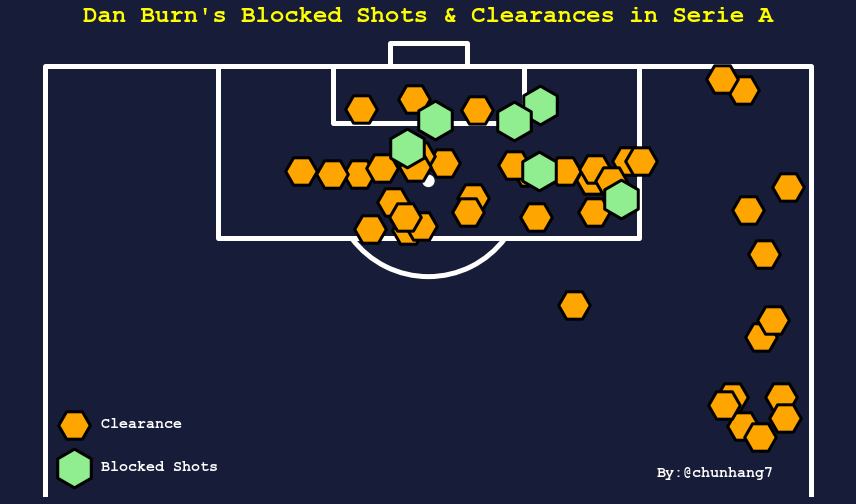

In [18]:
pitch = VerticalPitch(pad_bottom=-15,  # pitch extends slightly below halfway line
                      half=True,  # half of a pitch
                      goal_type='box',
                      pitch_type='statsbomb', 
                      pitch_color='#171c38', 
                      line_color='white',
                      linewidth=5, 
                      spot_scale=0.005)

fig, ax = pitch.draw(figsize=(12, 9))
fig.set_facecolor('#171c38')

plt.gca().invert_xaxis()

#plot

pitch.scatter(120-Clearancedf.x, 80-Clearancedf.y, s=1000, c='orange', edgecolors='black', 
              zorder=1, linewidth = 3, marker='H', ax=ax, label = ' Clearance')

#Blocks
pitch.scatter(120-Savedf.x, 80-Savedf.y, s=1500, c='lightgreen', edgecolors='black', 
              zorder=1, linewidth = 3, marker='h', ax=ax, label = ' Blocked Shots')


plt.title(player + "'s Blocked Shots & Clearances in Serie A",color='yellow',size=24, 
          fontfamily = "Courier New", fontweight = "bold")

# setup the legend
legend = ax.legend(loc='center left', bbox_to_anchor=(0.057, 0.11),facecolor='#171c38', edgecolor='None',
                   labelspacing=3)

for text in legend.get_texts():
    text.set_fontsize(15)
    text.set_fontfamily("Courier New")
    text.set_fontweight("bold")
    text.set_color('white')

    
#credits
fig.text(.9,.17,'By:@chunhang7',fontsize=15,fontfamily='Courier New',
       ha='right',color='w',fontweight='bold')
plt.show()